# プロジェクト

In [27]:
import pandas as pd
import numpy as  np
import csv
# import seaborn as sns
import sklearn as sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix,  accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot  as plt
%matplotlib inline

# 必要なモジュールがあれば適宜追加してください

In [28]:
import sklearn
print(sklearn.__version__)

0.19.1


## Q1
UCI Machine Learning Repositoryに公開されているワインの品質データセットを用いて、ワインの理化学検査結果に基づく特徴量からワインの品質を予測することを考えます。

以下では***白ワイン***のデータセットを使用します。（赤ワインのデータセットではないことに注意してください）

[Wine Quality Data Set ](https://archive.ics.uci.edu/ml/datasets/wine+quality)

各ワインのデータは以下の11種類の特徴量からなります。
- 1 - fixed acidity 
- 2 - volatile acidity 
- 3 - citric acid 
- 4 - residual sugar 
- 5 - chlorides 
- 6 - free sulfur dioxide 
- 7 - total sulfur dioxide 
- 8 - density 
- 9 - pH 
- 10 - sulphates 
- 11 - alcohol 

また、各ワインには0から10の品質スコアが付与さています。11種類の特徴量を元にワインの品質を高品質（ワインのqualityが6以上）、低品質（ワインのqualityが6未満）の2値にして予測する2クラス分類問題を考えます。

データ分析の実践のノートブック（practical_ds.ipynb）を参考に、以下に従ってワインの品質を2クラス分類として予測するモデルの学習と評価を行う一連のコードを実装しその実行結果を表示した上で、以下の各Qについて考察を記述してください。その他に工夫した点があればそれについても記述をしてください。授業で扱った内容を元に適切に分析を行っているか、独自の創意工夫があるか、を主に評価します。

- データの観察
    - Q. それぞれの特徴量の記述統計量、ばらつき・分布はどのようになっているでしょうか
    - Q. 欠損値、外れ値、重複データの処理は必要でしょうか
    - Q. 特徴量間の相関はどのようになっているでしょうか

- モデルの学習
    - データセットを訓練データとテストデータに分けます。テストデータは最終的に選択したモデルの評価に使います。訓練データは交差検証に使いモデルの選択と評価を行います。
    - ワインの品質を2クラス分類として予測するためのモデルとしてロジスティック回帰を考えます
        - 比較のためにその他のモデル（ランダムフォレスト、SVM、ニューラルネットワークなど）を使ってもらってもよいですが、それだけを持って大きく加点することはありません
    - 単純な特徴量を元に、モデルの基本となる精度を確認しましょう
         - Q. 単純なモデルとしてどのような特徴量を使うのがよいでしょうか
         - Q. どのような評価尺度を使うのがよいでしょうか
             - accuracy, precision, recall, f値など
         - Q. 単純なモデルではどの程度の精度が期待できるでしょうか
- モデルの選択と評価
    - モデルを複雑にして精度を向上させることを考えます
         - Q. どのような特徴量を作成・選択すればよいでしょうか
             - 特徴量作成：非線形変換、交差項、多項式、ドメイン知識の利用など
             - 特徴量選択：探索、相関・情報量、モデルベースなど
         - 訓練データを交差検証に使い、モデルの評価をしましょう
            - Q. どのような評価尺度を使うのがよいでしょうか
                - accuracy, precision, recall, f値など
            - Q. 単純なモデルに比べてどれぐらい精度が向上したでしょうか。どのような要因で精度が向上したのでしょうか 
    - モデルの複雑性は適切でしょうか
        - Q. アンダーフィッティング（High Bias）やオーバーフィッティング（High Variance）になっていないか確認しましょう
        - Q. もしHigh BiasやHigh Varianceの場合はどのように対処すればよいでしょうか
    - 最終的に選択したモデルをテストデータで評価しましょう
        - Q. 選択したモデルではどの程度の精度が期待できるでしょうか
        - Q. 今回のモデルを実際にワイン工場で品質予測システムとして実展開するにはどのようなことを検討する必要があるでしょうか

コードセルや説明用のマークダウンセルは必要な分だけ追加してください。マークダウンセルに記述する際は以下の記法を参考にしてください。

[マークダウンセルの記法](https://jupyter.brynmawr.edu/services/public/dblank/Jupyter%20Notebook%20Users%20Manual.ipynb#4.-Using-Markdown-Cells-for-Writing)

In [29]:
# 白ワインデータセットの読み込み
wine = pd.read_csv("winequality-white.csv", sep=";")

1. データの観察と前処理

In [30]:
# まずは重複データがあるかどうかを調べ、ある場合は除外する。
print('データセットのサイズ: ', len(wine))
wine = wine.drop_duplicates()
print('重複を取り除いたあとのデータセットのサイズ: ', len(wine))

データセットのサイズ:  4898
重複を取り除いたあとのデータセットのサイズ:  3961


+ 重複データが4898 - 3961 = 937件あったので取り除いた

In [31]:
# とりあえず各特徴量の統計量を観察する
wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000
mean,6.839346,0.280538,0.334332,5.914819,0.045905,34.889169,137.193512,0.993790,3.195458,0.490351,10.589358,5.854835
std,0.866860,0.103437,0.122446,4.861646,0.023103,17.210021,43.129065,0.002905,0.151546,0.113523,1.217076,0.890683
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.600000,0.035000,23.000000,106.000000,0.991620,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,4.700000,0.042000,33.000000,133.000000,0.993500,3.180000,0.480000,10.400000,6.000000
75%,7.300000,0.330000,0.390000,8.900000,0.050000,45.000000,166.000000,0.995710,3.290000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


+ それぞれの特徴量に外れ値がありそうなことは上の表のmeanとstdとmaxの値から予想できる。今回は特徴量の生成で多項式を用いるため、外れ値を除いた方がいいように思える。
+ 上の統計量をみても、正直あまり有益な情報を取り出すことができない。ワインについてのドメイン知識、あるいはそれぞれの特徴量についての知識がほとんどないからであろう。特徴量の間の相関やそれぞれの特徴量と「quality」あるいは「高品質or低品質」の相関をみてみればよいかもしれない。
+ それぞれの特徴量ごとの分布をみてみる

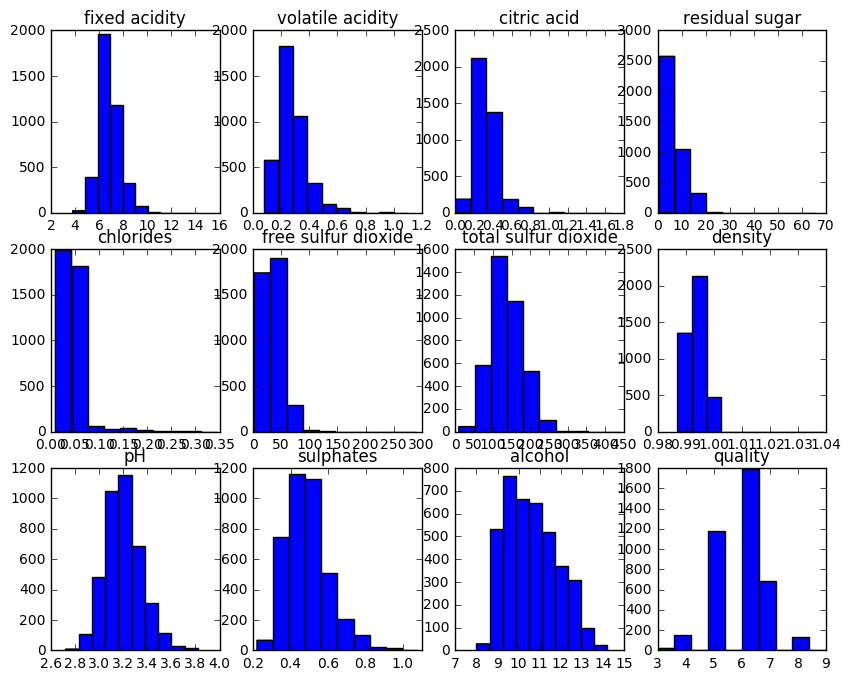

In [32]:
fig,axes = plt.subplots(nrows=3,ncols=4,figsize=(10,8))

axes[0, 0].hist(wine['fixed acidity'])
axes[0, 0].set_title('fixed acidity')
# axes[0, 0].xlim(3.8, 14.2)


axes[0, 1].hist(wine['volatile acidity'])
axes[0, 1].set_title('volatile acidity')

axes[0, 2].hist(wine['citric acid'])
axes[0, 2].set_title('citric acid')

axes[0, 3].hist(wine['residual sugar'])
axes[0, 3].set_title('residual sugar')

axes[1, 0].hist(wine['chlorides'])
axes[1, 0].set_title('chlorides')

axes[1, 1].hist(wine['free sulfur dioxide'])
axes[1, 1].set_title('free sulfur dioxide')

axes[1, 2].hist(wine['total sulfur dioxide'])
axes[1, 2].set_title('total sulfur dioxide')

axes[1, 3].hist(wine['density'])
axes[1, 3].set_title('density')

axes[2, 0].hist(wine['pH'])
axes[2, 0].set_title('pH')

axes[2, 1].hist(wine['sulphates'])
axes[2, 1].set_title('sulphates')

axes[2, 2].hist(wine['alcohol'])
axes[2, 2].set_title('alcohol')

axes[2,3].hist(wine['quality'])
axes[2,3].set_title('quality')


この分布に基づいて外れ値（上のヒストグラムとwine.describeで出た統計量を比較して決定）を除外する。（たとえば'fixed acidity'については4以下の値については4に、10以上の値については10に丸める）

In [33]:
# 特徴量の外れ値を上のグラフをみて適切な値に丸める
# fixed acidity
col = wine['fixed acidity']
col[np.abs(col) < 4] = 4
col[np.abs(col) > 10] = 10

# volatile acidity
col = wine['volatile acidity']
col[np.abs(col) < 0.2] = 0.2
col[np.abs(col) > 1] = 1

# citric acid
col = wine['citric acid']
col[np.abs(col) > 0.8] = 0.8

# residual sugar
col = wine['residual sugar']
col[np.abs(col) > 30] = 30

# chlorides
col = wine['chlorides']
col[np.abs(col) > 0.15] = 0.15

# free sulfur dioxide
col = wine['free sulfur dioxide']
col[np.abs(col) > 150] = 150

# total sulfur dioxide
col = wine['total sulfur dioxide']
col[np.abs(col) > 300] = 300

# density

# pH

# sulphates
col = wine['sulphates']
col[np.abs(col) > 0.8] = 0.8

# alcohol
col = wine['alcohol']
col[np.abs(col) < 9] = 9
col[np.abs(col) > 13] = 13


/Users/fujiki/.pyenv/versions/anaconda3-4.1.1/lib/python3.5/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/fujiki/.pyenv/versions/anaconda3-4.1.1/lib/python3.5/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
/Users/fujiki/.pyenv/versions/anaconda3-4.1.1/lib/python3.5/site-packages/ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

In [34]:
# 外れ値を除去した後の統計量
wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000
mean,6.837528,0.287073,0.333628,5.905377,0.045323,34.854077,137.124337,0.993790,3.195458,0.489114,10.591609,5.854835
std,0.856490,0.096040,0.118480,4.780824,0.019124,16.829246,42.789805,0.002905,0.151546,0.109272,1.178049,0.890683
min,4.000000,0.200000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,9.000000,3.000000
25%,6.300000,0.210000,0.270000,1.600000,0.035000,23.000000,106.000000,0.991620,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,4.700000,0.042000,33.000000,133.000000,0.993500,3.180000,0.480000,10.400000,6.000000
75%,7.300000,0.330000,0.390000,8.900000,0.050000,45.000000,166.000000,0.995710,3.290000,0.550000,11.400000,6.000000
max,10.000000,1.000000,0.800000,30.000000,0.150000,150.000000,300.000000,1.038980,3.820000,0.800000,13.000000,9.000000


In [35]:
# 正解ラベルを1（高品質：ワインのqualityが6以上）か0（低品質：ワインのqualityが6未満）とする
y = wine['quality'].values
y = (y>=6).astype(np.int) 
print(np.sum(y==1, axis=0)) # 高品質ワインデータの数
print(np.sum(y==0, axis=0)) # 低品質ワインデータの数

wine['ans'] = y

2613
1348


/Users/fujiki/.pyenv/versions/anaconda3-4.1.1/lib/python3.5/site-packages/ipykernel_launcher.py:2: FutureWarning: pandas.scatter_matrix is deprecated. Use pandas.plotting.scatter_matrix instead
  


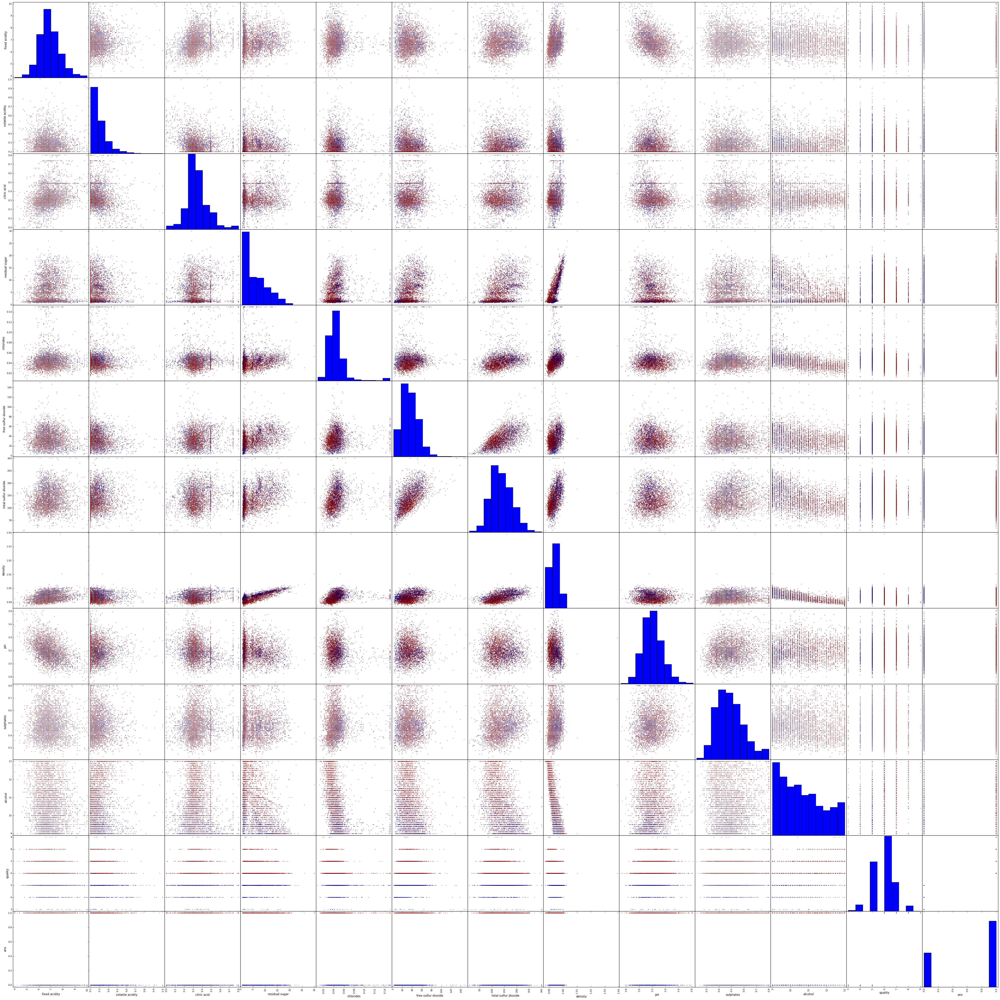

In [36]:
# 二つの特徴量の間の相関図
grr = pd.scatter_matrix(wine, c=y, figsize=(60, 60))

+ 上の散布図では高品質ワインが赤、低品質ワインが青としてデータ間の相関がプロットされている。
+ 特徴量間の相関をみて、相関の高いものについてはどちらかを除去する。つまり多重共線性があるとみなし、どちらかの特徴量を採用する。今回は'free sulfur dioxide'と'total sulfur dioxide'のうち'free sulfur dioxide'を採用し、また'density'がいくつかの特徴量と比較的高い相関を示したので、'density'の特徴量からの除去を行った。
+ 特徴量とqualityとの相関をみてみると、若干ではあるが'fixed acidity'と'volatile acidity'に負の相関が、'alcohol'に正の相関があるように認められる。すべての特徴量と'quality'との相関を求めてみる。

In [37]:
# 特徴量と'quality'との相関を求める
corrcoef = np.corrcoef(wine.values.transpose())
print(corrcoef[11])

[-0.12410788 -0.18246261  0.0074087  -0.11964493 -0.23982346  0.01742959
 -0.18042189 -0.33780471  0.1238286   0.04761244  0.46393079  1.
  0.80489982]


+ 上は'quality'と他の特徴量との相関係数のリストである。最後の0.804は'quality'と「高品質or低品質」を示す「0or1」との相関なので無視して良い。上のリストを見てみると先にした'fixed acidity'、'volatile acidity'と'quality'との負の相関はあるとまではいえない（-0.12と-0.19）が、'alcohol'と'quality'との正の相関はあるといってもよい（0.46）だろう。ただ、'alcohol'だけで'quality'を予測するほど十分でもない。
+ 以下では以上のデータ観察と前処理をもとに特徴量エンジニアリングを行い、高い評価値をだせる適切な複雑さをもつモデルを構築する。モデルの評価値は課題ファイルにもともとあった単純なモデルの値と比較する。

2. モデルの学習、選択、評価

In [38]:
# 特徴量
# 先の相関図をみて、'density'　と 'free sulfur dioxide'を落とす。
X = wine[ ['fixed acidity','volatile acidity','citric acid','residual sugar','chlorides', 'total sulfur dioxide', 'pH', 'sulphates','alcohol']].values

In [39]:
# すべての特徴量を使ってロジスティック回帰によりワイン品質の分類する。
# 訓練データとテストデータに分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1, stratify=y) 

以下が単純なモデルによる分類である

In [41]:
# ロジスティック回帰モデル
lr = LogisticRegression()

# 標準化
sc = StandardScaler()
sc.fit(X_train)
norm_X_train =  sc.transform(X_train)
norm_X_test =  sc.transform(X_test)
   
lr.fit(norm_X_train, y_train)    
y_pred = lr.predict(norm_X_test)

print('混同行列: ', confusion_matrix(y_test, y_pred)) # 混同行列
print('accuracy: ', accuracy_score(y_test, y_pred)) # accuracy
print('precision_score: ', precision_score(y_test, y_pred)) # precision
print('recall: ', recall_score(y_test, y_pred)) # recall
print('f値: ', f1_score(y_test, y_pred))  # f値

# 特徴量ごとのパラメータ重み
pd.DataFrame(lr.coef_, index=['weight'], columns=wine.drop(["quality", "ans", "density", "free sulfur dioxide"], axis=1).columns.values)

混同行列:  [[ 71  64]
 [ 45 217]]
accuracy:  0.72544080604534
precision_score:  0.7722419928825622
recall:  0.8282442748091603
f値:  0.7992633517495394


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,total sulfur dioxide,pH,sulphates,alcohol
weight,-0.1821,-0.594444,0.059585,0.230998,0.001369,0.033044,0.095705,0.161367,1.232294


以下が本課題におけるモデルの学習、それから選択と評価である。  
ベースはもともと書かれていたコードである。ベースのコードでは多項式による特徴量作成と正則化、またそれぞれのパラメータのグリッドサーチとモデル評価の交差検証を行なっている。
ベースコードのパフォーマンスは上の単純なモデルよりもよいので、本課題ではベースコードに比較してより良いモデルを構築することを目指す。

--------参考までにベースで書かれていたコードの評価は以下である（重複データ除去後）----------  
混同行列:  
[[ 78  57]  
 [ 48 214]]  
accuracy: 0.7355163727959698  
precision_score: 0.7896678966789668  
recall: 0.816793893129771  
f値: 0.8030018761726079  

In [42]:
degree=[1,2,3]
C=[100, 10, 1, 0.1, 0.01]
for n in degree:
    for r in C:
        pipe = make_pipeline(PolynomialFeatures(degree=n), StandardScaler(), LogisticRegression(C=r))
        scores=cross_validate(pipe, X_train, y_train, cv=10, scoring=('precision', 'recall', 'f1'),return_train_score=True)
        print(n, r, scores['test_precision'].mean(), scores['test_recall'].mean(), scores['test_f1'].mean())

1 100 0.7749195898017763 0.8638983050847457 0.8168146592555505
1 10 0.7749195898017763 0.8638983050847457 0.8168146592555505
1 1 0.7752787324564266 0.8643220338983051 0.8172140953491975
1 0.1 0.7731420704299569 0.8655968265416517 0.8165990927565531
1 0.01 0.7736012288897267 0.8698431301839162 0.8187127360603084
2 100 0.7838941719356278 0.8728326721961774 0.8257329698280149
2 10 0.7847362152810179 0.8724053371799494 0.8259910802494984
2 1 0.7857387869710839 0.8749567255679768 0.82770460824322
2 0.1 0.785789992593825 0.8715488640461594 0.8261542077086348
2 0.01 0.7891038548855833 0.8596429859358095 0.8226317106966059
3 100 0.7953725636355499 0.8604868373602595 0.8264822366001537
3 10 0.7943532517346326 0.8702794807068157 0.8303834159839253
3 1 0.7911464634333054 0.873258204111071 0.8299306994518076
3 0.1 0.786701224021827 0.8736783267219618 0.8276635762556136
3 0.01 0.7926048152847261 0.8579390551749009 0.8237260919600488


グリッドサーチと交差検証の結果から、多項式の次数を3、正則化のハイパーパラメータを100としたモデルを採用してテストデータで評価する。

In [43]:
lr = LogisticRegression(C=100) # ロジスティック回帰モデル

# 多項式
poly=PolynomialFeatures(degree=3)
poly_X_train=poly.fit_transform(X_train)
poly_X_test=poly.transform(X_test)

# 標準化
sc = StandardScaler()
norm_X_train =  sc.fit_transform(poly_X_train)
norm_X_test =  sc.transform(poly_X_test)
   
lr.fit(norm_X_train, y_train)     
y_pred = lr.predict(norm_X_test)

print('混同行列: ', confusion_matrix(y_test, y_pred)) # 混同行列
print('accuracy: ', accuracy_score(y_test, y_pred)) # accuracy
print('precision_score: ', precision_score(y_test, y_pred)) # precision
print('recall: ', recall_score(y_test, y_pred)) # recall
print('f値: ', f1_score(y_test, y_pred))  # f値

混同行列:  [[ 79  56]
 [ 38 224]]
accuracy:  0.7632241813602015
precision_score:  0.8
recall:  0.8549618320610687
f値:  0.8265682656826568


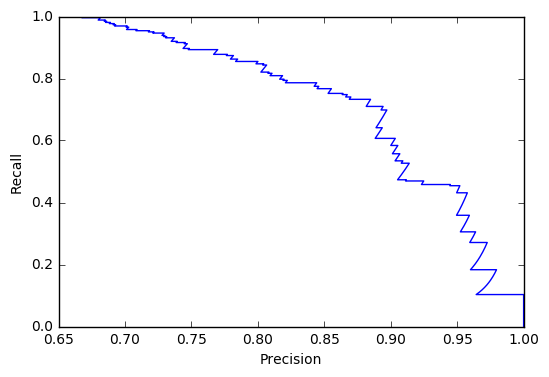

In [44]:
y_pred_proba=lr.predict_proba(norm_X_test)
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba[:,1])
plt.plot(precision, recall)
plt.xlabel('Precision')
plt.ylabel('Recall');

-------------モデルの評価---------------------
+ 今回のデータセットでは高品質のワインが低品質のワインの二倍ほど多い。したがって精度76%が意味するのは、およそ40%弱のデータについて自信を持ってモデルは正しく分類できたということである。（もし、わからないデータについてすべて「高品質」と答えれば60%はあたるため）  
+ 今回の学習では訓練データの精度がおよそ80%、テストデータの精度がおよそ76%でありモデルの複雑性はほとんど適切であると考えてよいだろう。これは正則化の度合いと、特徴量エンジニアリングにおいて多項式の次数をグリッドサーチによって決めたからである。ベースコードに比べて過学習の度合いが減ったのは、前処理において特徴量を観察しながら、いくつかを削除したり、外れ値を丸めたりしたのも効いたのかもしれない。

-------------ワイン工場での実運用についての考察---------------
+ ワイン工場での実運用となると問題なのは「低品質ワインを高品質ワインと判定」してしまう偽陽性である。したがって精度の他の重要な指標はprecision_scoreである。
今回のモデルでは、精度、presicion_score共に単純なモデル、およびベースモデルより少しではあるが、その評価をあげることができた。  
（精度は+3%ほど。presicion_scoreは+1.6％ほど。recallは1%ほど。f値は+2%ほど）  

+ 実運用において高いブランド力での展開を目指すのであれば、多少recallの値は捨ててでもpresicion_scoreを高く保つようにモデルを構築するのがよいだろう。今回のモデルであれば上のPrecision-Recallのグラフに鑑みて0.95（Precision）で0.4(Recall)あたりの点をとってもいいだろう。

## Q2
課題4で使用した各行に講義名のテキストデータが含まれている"course_list.csv"ファイルについて、講義名に"統計"または"データ"または"情報"を含む講義を以下のように抽出します。

本学で開講されている統計、情報関連の講義の全体像について分かりやすく提示することを考え、そのためのコードを実装しその実行結果を表示した上で、分析の方針、得られた結果、工夫した点について考察を記述してください。授業で扱った内容を元に適切に分析を行っているか、独自の創意工夫があるか、を主に評価します。

例1:
- 講義名に含まれる単語間の共起を計算する
- "統計", "データ", "情報"がそれぞれどのような単語と共起しているか統計量を計算し可視化する
- 単語間共起からネットワークを作成し分析・可視化することもできる

例2:
- 各講義のベクトルを作成する
- 講義をクラスタリングする（ベクトル間の距離・類似尺度やクラスタ数は適切に決定する）
- クラスタに含まれる講義のテキストデータからそのクラスタにラベルをつける
- 各クラスタの大きさやラベルを可視化する

例3:
- 各講義のベクトルを作成する
- 講義間の類似度を計算する
- 類似度が一定以上の講義間にリンクがあるとして、講義ネットワークを作成する
- ネットワークを分析・可視化する

以下では「統計」「データ」「情報」というワードを含む講義のネットワークを分析し、より多くの講義に関連した「重要な」講義を見つけ出すことを目的とする。それによって「統計」「データ」「情報」といったテーマに関して学び始めたい初学者がどの講義から手をつけ、またどの講義を続けて履修し学びを深めていけばよいかを提案できるようにしたい。
そのための手順は以下の通りである。
+ keyword_list.csvとcourse_list.csvからtfidf行列を求め、講義間の類似度を計算する。
+ 類似度が基準を超えている講義の間にリンクがあるとみなし、講義ネットワークを形成する。
+ 講義ネットワークを可視化し、上の課題について考察する。

In [45]:
import networkx as nx
from networkx.algorithms import community

In [46]:
def tfidf():
    # keyword_list.csvの読み込み
    with open('keyword_list.csv', 'r',  encoding="utf-8") as f:
        vocab = [row[0] for row in  csv.reader(f)]

    # course_list.csvの読み込み
    with open('course_list.csv', 'r',  encoding="utf-8") as csvf:
        courses = [row[0] for row in  csv.reader(csvf)  if "統計" in row[0] or "データ" in row[0] or "情報" in row[0]]
    
    df = {}
    for i in vocab:
        counter = 0
        for j in courses:
            if i in j:
                counter += 1
        df[vocab.index(i)] = counter

    mat = np.zeros((len(courses), len(vocab)))
    for i in courses:
        for j in vocab:
            if j in i:
                tmp_list = i.split(j)
                mat[courses.index(i), vocab.index(j)] = (len(tmp_list)-1) * (np.log(len(courses) / df[vocab.index(j)]))

                 
    return  courses, vocab, mat

courses, vocab, tfidf_matrix=tfidf()

In [47]:
def cos_sim(vec1, vec2):
    return np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))

In [48]:
def find_similar_course(_target, _matrix, _courses):
    ### 引数：
    # _target:  入力講義のID
    # _matrix: 講義-単語行列（TFIDF値)
    # _courses: 講義リスト

    target_mat = _matrix[_target]
    sim_dic = {}
    for i in range(len(_courses)):
        sim = cos_sim(target_mat, _matrix[i])
        if not sim > 0.99:
            if not sim < 0.01:
                sim_dic[_courses[i]] = sim
    return sim_dic

In [49]:
# コサイン類似度0.5以上をリンクがあるとみなす。逆に0.8以上は除く。（たとえばシステム情報工学演習第一とシステム情報工学演習第二のようにほぼ同一な講義名をもつ講義間の
# リンクをなるべく除外するため）
result = {}
for i in courses:
    result_i = [k for k, v in find_similar_course(courses.index(i), tfidf_matrix, courses).items() if v >= 0.5 and v <= 0.8]
    result[i] = result_i

In [50]:
result

{'システムデータ解析': ['応用データ解析', '統計解析', '医学データの統計解析'],
 'システム情報工学実験第一': ['システム情報工学演習第三',
  'システム情報工学設計演習',
  '情報工学実験',
  '数理情報工学実験第二',
  'システム情報工学特論',
  'システム情報工学演習第二',
  'システム情報工学輪講第一',
  '数理情報工学実験第一',
  'システム情報工学輪講第二'],
 'システム情報工学実験第二': ['システム情報工学設計演習',
  '情報工学実験',
  '数理情報工学実験第二',
  'システム情報工学輪講第一',
  'システム情報工学演習第一',
  'システム情報工学輪講第二'],
 'システム情報工学演習第一': ['システム情報工学実験第二',
  'システム情報工学設計演習',
  '数理情報工学演習第一Ａ',
  'システム情報工学輪講第一',
  '数理情報工学演習第一Ｂ',
  'システム情報工学輪講第二',
  '数理情報工学演習第一Ｃ'],
 'システム情報工学演習第三': ['システム情報工学設計演習',
  'システム情報工学輪講第一',
  'システム情報工学実験第一',
  'システム情報工学輪講第二'],
 'システム情報工学演習第二': ['システム情報工学設計演習',
  'システム情報工学輪講第一',
  'システム情報工学実験第一',
  'システム情報工学輪講第二'],
 'システム情報工学特論': ['システム情報工学設計演習',
  'システム情報工学輪講第一',
  'システム情報工学実験第一',
  'システム情報工学輪講第二'],
 'システム情報工学設計演習': ['システム情報工学演習第三',
  'システム情報工学実験第二',
  'システム情報工学特論',
  'システム情報工学演習第二',
  'システム情報工学実験第一',
  'システム情報工学演習第一',
  'システム情報工学輪講第二'],
 'システム情報工学輪講第一': ['数理情報工学輪講',
  'システム情報工学演習第三',
  'システム情報工学実験第二',
  'システム情報工学特論',
  'システム情報工学演習第二',
  'システム情報工学実験第一',
  '

In [51]:
# resultからエッジ情報をタプルのリストとして作成
edges = []
for k, v in result.items():
    for j in v:
        edges.append((courses.index(k), courses.index(j)))

In [57]:
G = nx.Graph()

In [58]:
# ノードを追加
for i in courses:
    G.add_node(courses.index(i))

In [59]:
# エッジ追加
G.add_edges_from(edges)

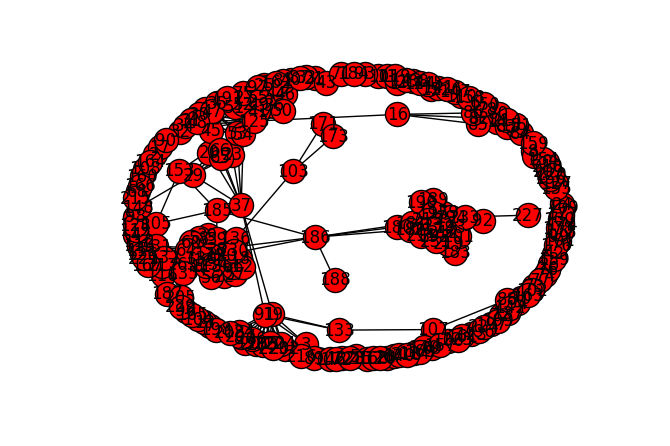

In [61]:
# グラフの描画
nx.draw(G, with_labels=True)

In [62]:
# 上のネットワーク図のIDと講義名の対応表
for i in courses:
    print('ID: ', courses.index(i), '    講義名: ', i)

ID:  0     講義名:  生態統計学
ID:  1     講義名:  情報科教育法II
ID:  2     講義名:  情報科教育法I
ID:  3     講義名:  心理統計学
ID:  4     講義名:  情報生物学実習
ID:  5     講義名:  心理統計実習
ID:  6     講義名:  統計力学演習[数理自然科学コース]
ID:  7     講義名:  確率統計II
ID:  8     講義名:  統計力学II[数理自然科学コース]
ID:  9     講義名:  統計力学I[数理自然科学コース]
ID:  10     講義名:  統計力学演習[物質基礎科学コース]
ID:  11     講義名:  統計力学II[物質基礎科学コース]
ID:  12     講義名:  統計力学I[物質基礎科学コース]
ID:  13     講義名:  確率統計I
ID:  14     講義名:  情報と計算の物理[数理自然科学コース]
ID:  15     講義名:  情報と計算の物理[物質基礎科学コース]
ID:  16     講義名:  数理情報学
ID:  17     講義名:  統計力学I[統合生命科学コース]
ID:  18     講義名:  情報工学V
ID:  19     講義名:  統計学II
ID:  20     講義名:  総合情報学特論II
ID:  21     講義名:  人間情報学I
ID:  22     講義名:  情報工学V（１）
ID:  23     講義名:  総合情報学特論I
ID:  24     講義名:  地理情報分析基礎II
ID:  25     講義名:  人間情報学I（１）
ID:  26     講義名:  地理情報分析基礎I
ID:  27     講義名:  統計学実習[広域システムコース]
ID:  28     講義名:  統計学[国際環境学コース]
ID:  29     講義名:  総合情報学実習
ID:  30     講義名:  人間情報学IV
ID:  31     講義名:  人間情報学III（１）
ID:  32     講義名:  人間情報学I（３）
ID:  33     講義名:  人間情報学I（２）
ID:  34     講義名

上のネットワーク図では多くのノードが重なり合っているが、ここからいくつかの特徴をみてとることができる。（そのためあえてラベルをつけずに表示している）

1. ほとんどのノード（円環上に位置するノード）はせいぜい数個のリンクしかもたない。  
2. いくつかのノードは多くのリンクを持ち、ネットワーク上でハブの役割を果たしている。（次数中心性が大きい）  
3. それらのハブをつなぐ中心ノードがいくつか存在する。 （媒介中心性が大きい）

ネットワーク図からは上の3で表せるような中心ノードとしてたとえば  

ID: 16    講義名:  数理情報学  
ID: 37    講義名:  統計学（総合情報学コース）  
ID: 103  講義名:  情報学概論  
ID: 105  講義名:  基礎統計  
ID: 153  講義名:  基礎情報学  
ID: 185  講義名:  情報基礎実験    
ID: 205  講義名:  確率統計学基礎    

などがあげられ、これらは課題の最初に取り決めたような「重要な」講義であるという分析結果を提出することができる。たしかに他の講義の基礎となるような講義が並んでいることがみてとれるだろう。  

さて、まず自身がもつリンク数という観点から、以上のことをさらに検討する。

In [63]:
# 各ノードのリンク数を計算
linked_node = []
num_edges = {}
for i in edges:
    for j in i:
        linked_node.append(j)

In [64]:
import collections

c = collections.Counter(linked_node)

In [65]:
print(c)

Counter({118: 38, 121: 38, 38: 36, 120: 36, 129: 34, 130: 34, 134: 34, 181: 32, 182: 32, 53: 30, 54: 30, 125: 30, 211: 30, 212: 30, 213: 30, 217: 30, 136: 28, 192: 28, 193: 28, 231: 28, 232: 28, 179: 26, 180: 26, 194: 26, 195: 26, 19: 24, 91: 24, 124: 24, 201: 22, 219: 22, 233: 20, 37: 18, 44: 18, 46: 18, 131: 18, 18: 16, 22: 16, 39: 16, 56: 16, 57: 16, 58: 16, 59: 16, 60: 16, 61: 16, 62: 16, 63: 16, 64: 16, 111: 16, 189: 16, 190: 16, 230: 16, 45: 14, 112: 14, 126: 14, 132: 14, 135: 14, 183: 14, 186: 14, 8: 12, 9: 12, 20: 12, 23: 12, 29: 12, 65: 12, 66: 12, 117: 12, 174: 12, 178: 12, 92: 10, 99: 10, 100: 10, 101: 10, 127: 10, 155: 10, 175: 10, 176: 10, 177: 10, 14: 8, 15: 8, 16: 8, 36: 8, 41: 8, 49: 8, 50: 8, 51: 8, 52: 8, 55: 8, 82: 8, 85: 8, 86: 8, 107: 8, 113: 8, 115: 8, 116: 8, 128: 8, 142: 8, 149: 8, 154: 8, 156: 8, 185: 8, 205: 8, 209: 8, 210: 8, 220: 8, 3: 6, 27: 6, 42: 6, 70: 6, 79: 6, 83: 6, 84: 6, 103: 6, 105: 6, 106: 6, 133: 6, 138: 6, 143: 6, 153: 6, 168: 6, 200: 6, 202: 6,

この結果によるとリンクが多いノード（講義）top5は  

ID: 120  講義名:  数理情報工学実験第二  
ID: 38    講義名:  情報工学実験  
ID: 118  講義名:  数理情報工学演習第二Ａ  
ID: 121  講義名:  数理情報工学演習第二Ｂ  
ID: 53    講義名: 情報数理科学II(総合情報学コース）  

であり、上であげた「重要な講義」と全く一致しない。つまりこれらの「多くのリンクをもつ講義」は最初にあげた3stepのうち2にあたる、ネットワークにおいてハブとしての役割を果たす講義なわけである。  
そう考えると、最初にあげた3stepにしたがって講義を区分することはある程度有効であるように思える。すなわち、「統計」「情報」「データ」について効率的に学習したい場合、ネットワークにおける多媒介的な講義（step3）からハブ講義(step2)それから円環上講義(step1)に向かって（3→2→1というふうに段階的に）履修すればよいという提案を出すことができる。  
